## Lane detection using Canny Edge detector

Loading the Test images

In [44]:
import matplotlib.pyplot as plt
import cv2
import glob
import numpy as np

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [45]:
def show_images(images, cmap=None):
    cols = 2
    rows = (len(images)+1)//cols
    
    plt.figure(figsize=(10, 11))
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        # use gray scale color map if there is only one channel
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()

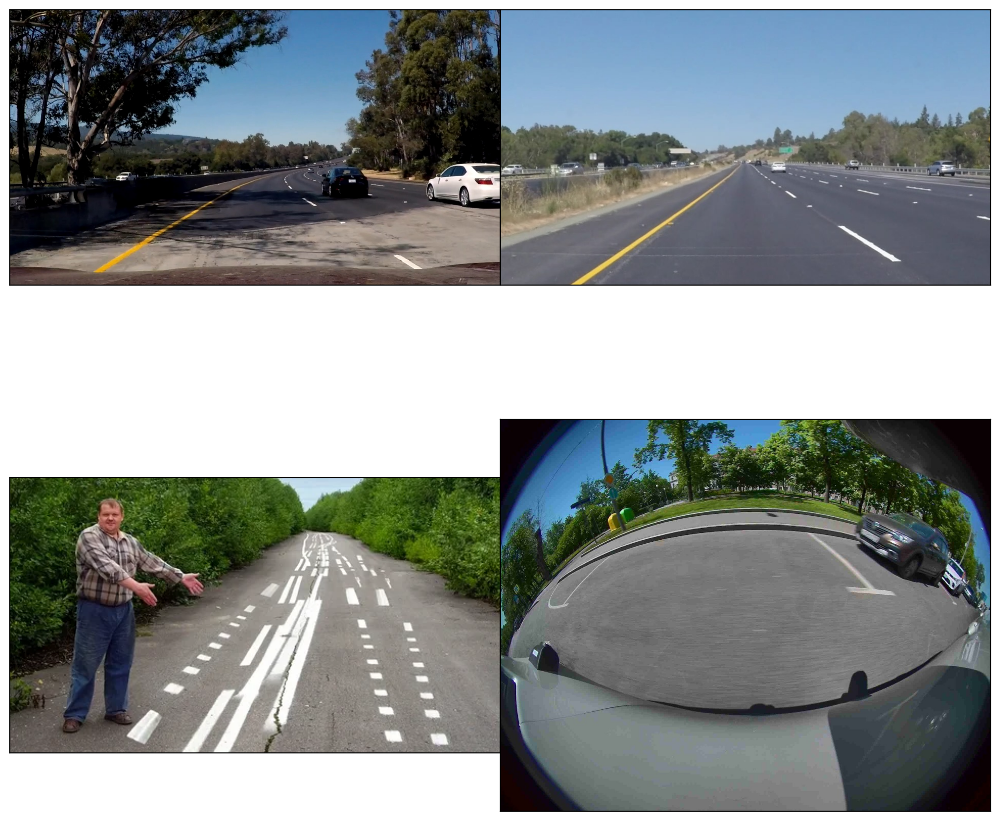

In [46]:
test_images = [plt.imread(path) for path in glob.glob('test_images/*')]
show_images(test_images)

#### Color Selection

Selecting only yellow and white colors in the images using the RGB channels

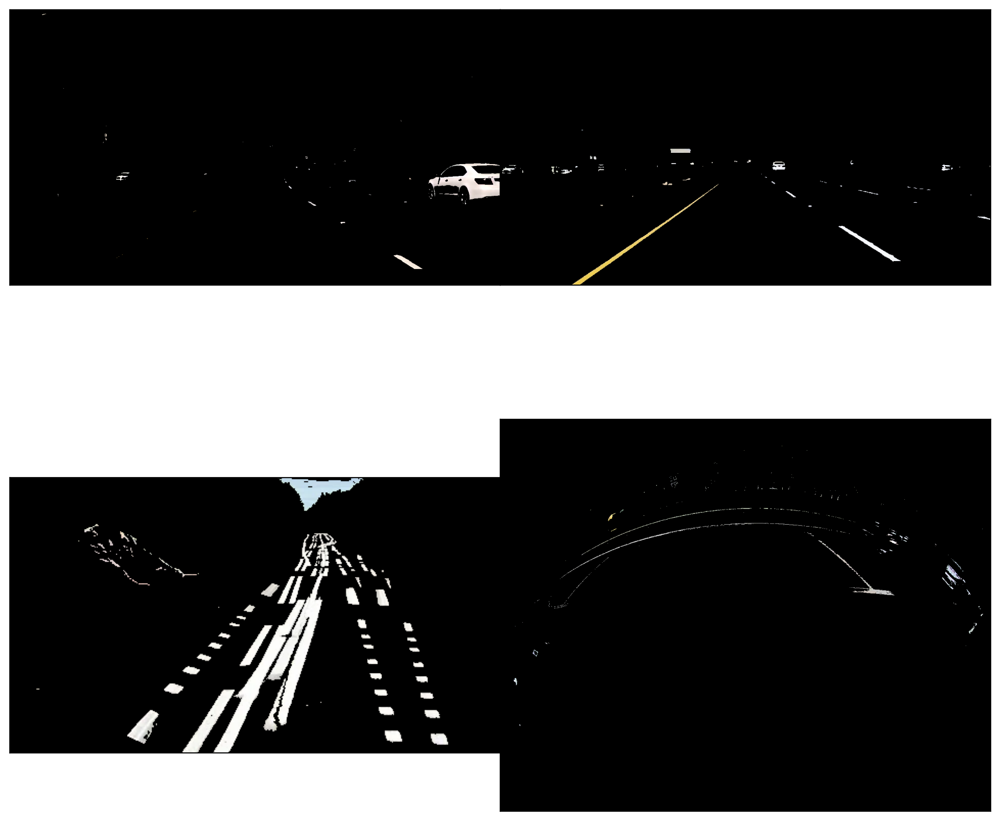

In [47]:
def select_rgb_white_yellow(image): 
    # Убедимся, что изображение имеет 4 канала
    if image.shape[-1] == 4:
        # Удаляем альфа-канал
        image = image[:, :, :3]
   
    # Белая маска
    lower_white = np.uint8([200, 200, 200])
    upper_white = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(image, lower_white, upper_white)
    
    # Желтая маска
    lower_yellow = np.uint8([190, 190, 0])
    upper_yellow = np.uint8([255, 255, 255])
    yellow_mask = cv2.inRange(image, lower_yellow, upper_yellow)
    
    # Объединяем маски
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked = cv2.bitwise_and(image, image, mask=mask)
    return masked

show_images(list(map(select_rgb_white_yellow, test_images)))

RGB images are converted into HLS color space

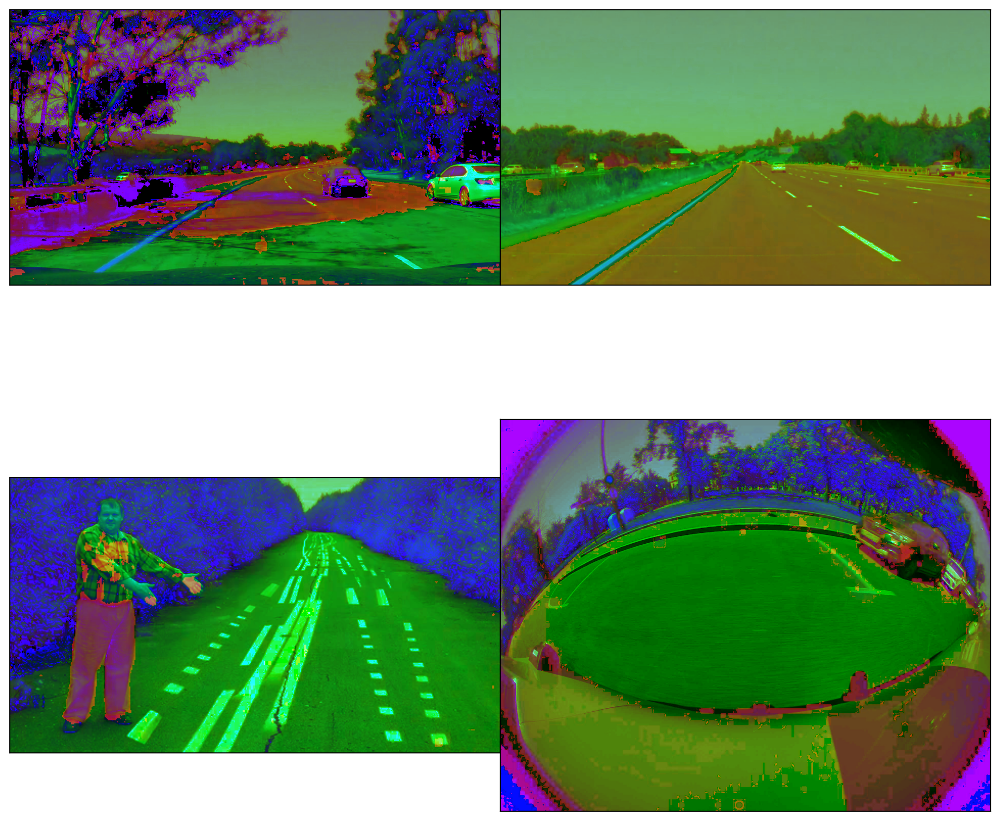

In [48]:
def convert_hls(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

show_images(list(map(convert_hls, test_images)))

Filter to select those white and yellow lines

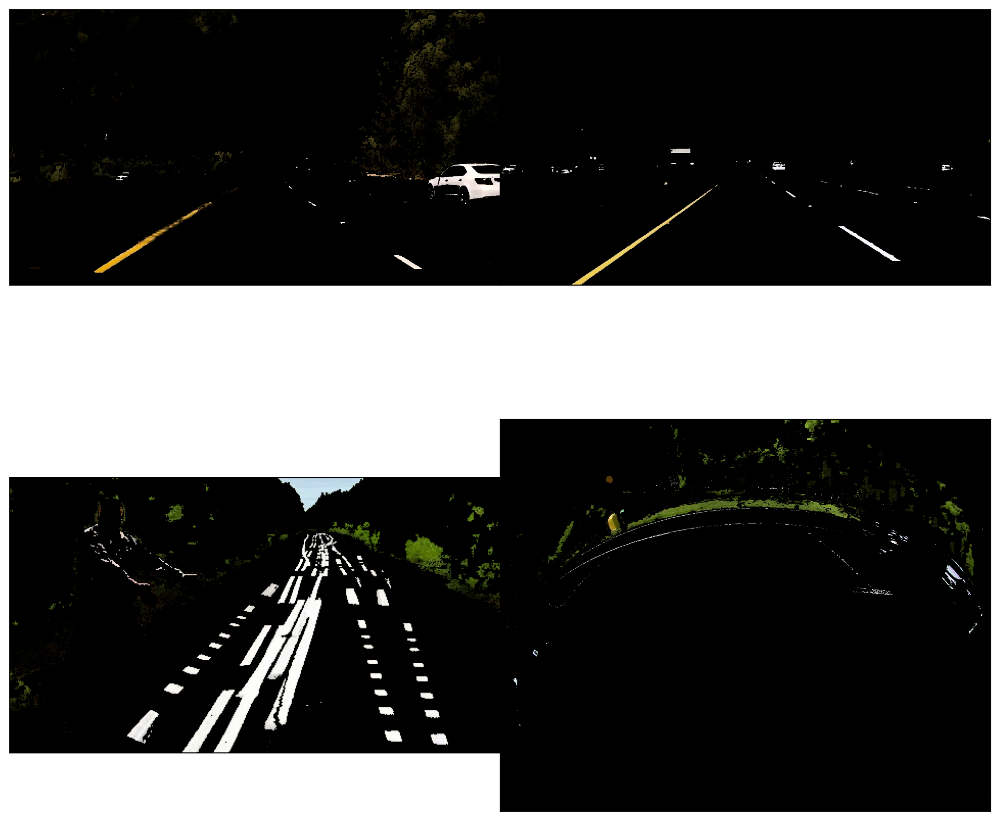

In [49]:
def select_white_yellow(image):
    converted = convert_hls(image)
    # white color mask
    lower = np.uint8([  0, 200,   0])
    upper = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(converted, lower, upper)
    # yellow color mask
    lower = np.uint8([ 10,   0, 100])
    upper = np.uint8([ 40, 255, 255])
    yellow_mask = cv2.inRange(converted, lower, upper)
    # combine the mask
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    return cv2.bitwise_and(image, image, mask = mask)

white_yellow_images = list(map(select_white_yellow, test_images))
show_images(white_yellow_images)

#### Step 2: Canny Edge Detection: canny edge detector for detecting edges in order to find lane lines


Gray Scaling: converting into gray scaled in order to detect shapes in images

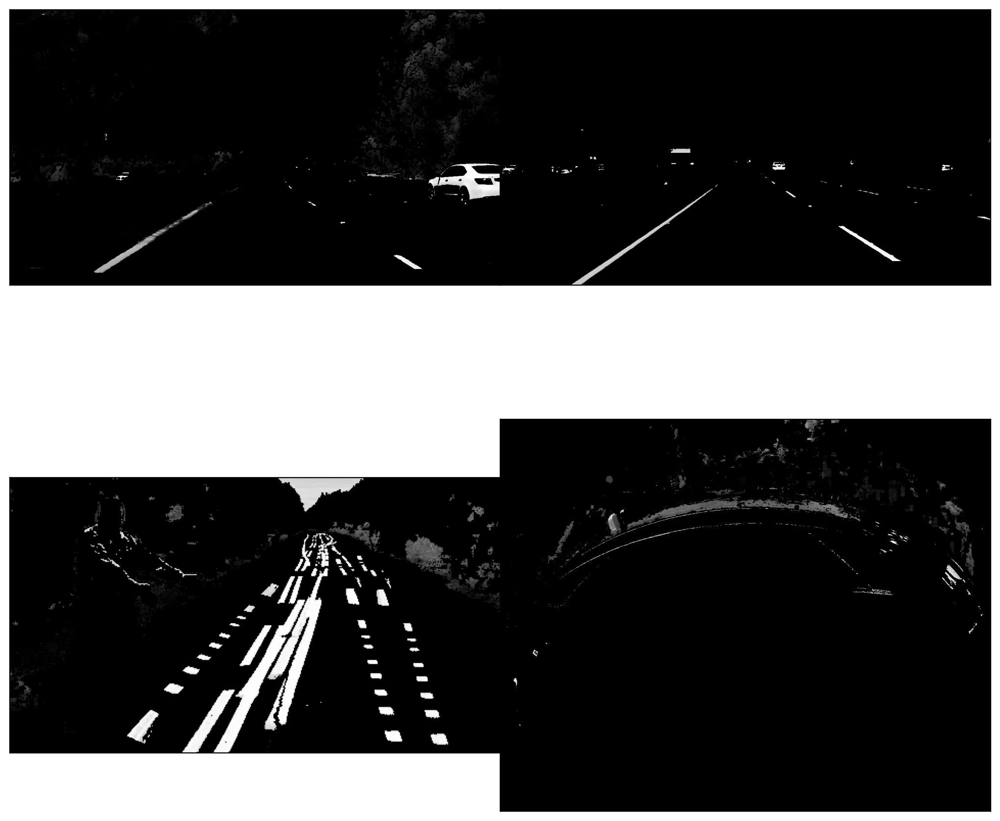

In [50]:
def convert_gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

gray_images = list(map(convert_gray_scale, white_yellow_images))
show_images(gray_images)

Gaussian Blur: making the edges smoother

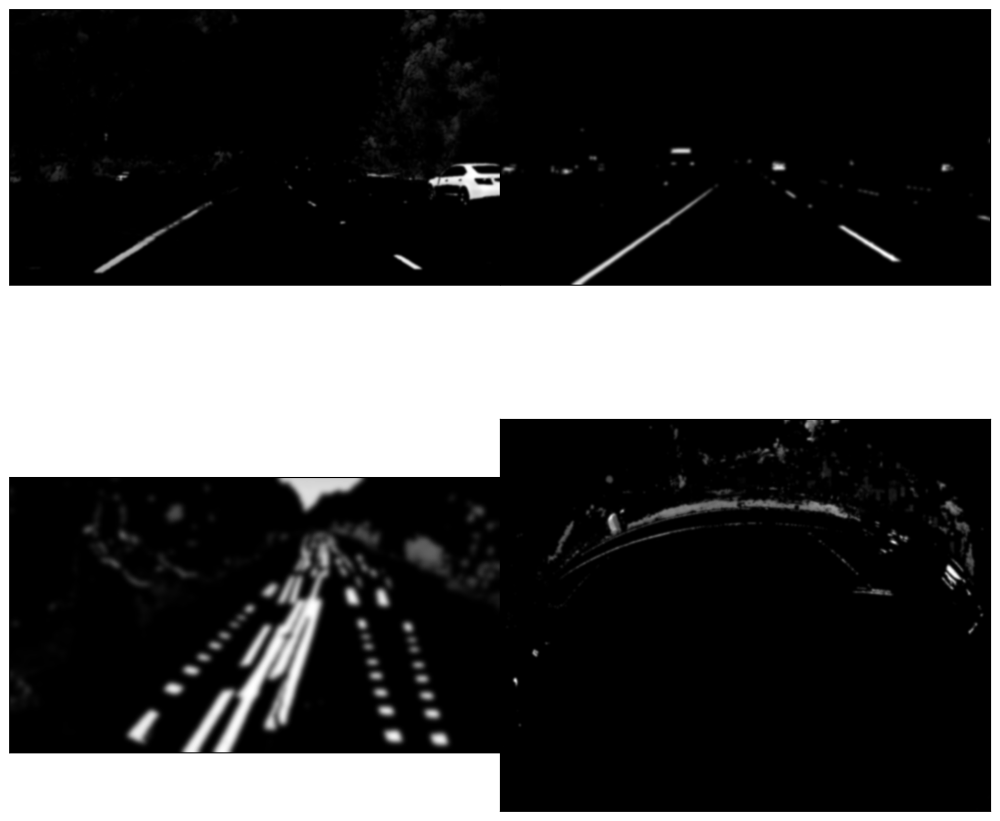

In [51]:
def apply_smoothing(image, kernel_size=15):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

blurred_images = list(map(lambda image: apply_smoothing(image), gray_images))
show_images(blurred_images)

Edge Detection: detecting edges in images

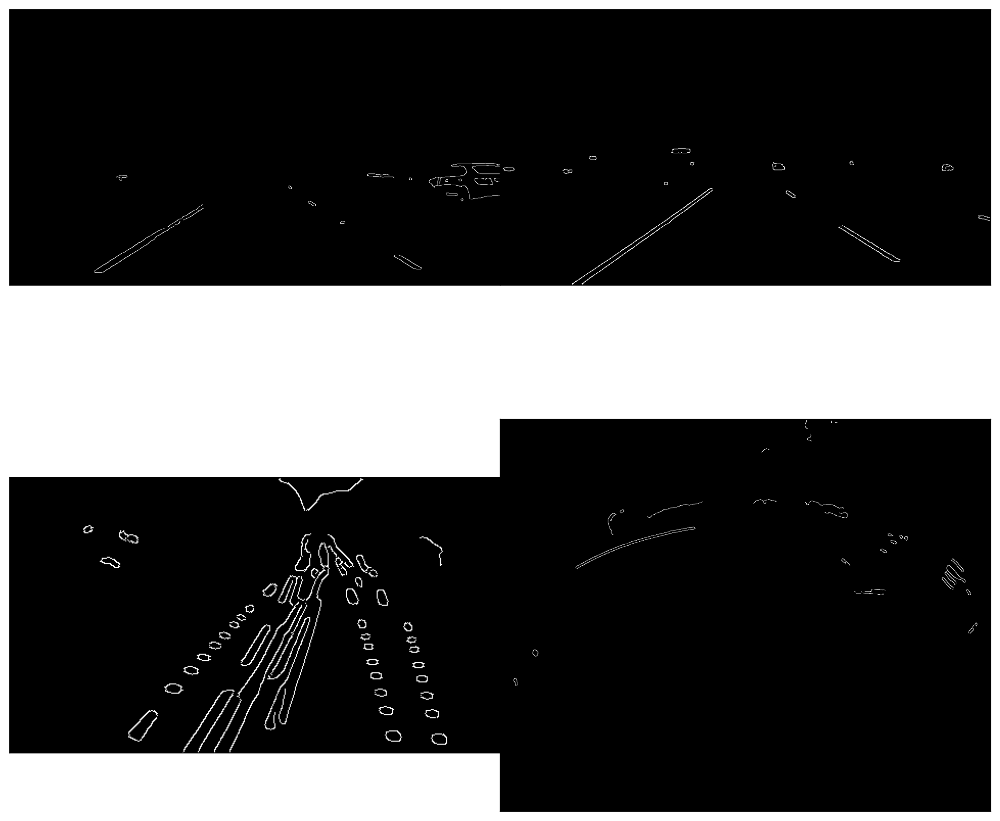

In [52]:
def detect_edges(image, low_threshold=50, high_threshold=150):
    return cv2.Canny(image, low_threshold, high_threshold)

edge_images = list(map(lambda image: detect_edges(image), blurred_images))
show_images(edge_images)